Original Dataset Download:https://www.kaggle.com/datasets/alitaqi000/world-university-rankings-2023

Cleaned Dataset Download: https://www.kaggle.com/datasets/samiatisha/world-university-rankings-2023-clean-dataset

In [1]:
library(tidyverse)
library(ggplot2)
library(cowplot)

data <- read.csv("data/World University Rankings 2023.csv") ## Reading in the original version of the dataset
data_cleaned <- read.csv("data/Preprocessed World University Rankings 2023 Dataset.csv") ## Reading in the cleaned version of the dataset
head(data)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp




,University.Rank,Name.of.University,Location,No.of.student,No.of.student.per.staff,International.Student,Female.Male.Ratio,OverAll.Score,Teaching.Score,Research.Score,Citations.Score,Industry.Income.Score,International.Outlook.Score
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,University of Oxford,United Kingdom,"20,965",10.6,42%,48 : 52,96.4,92.3,99.7,99.0,74.9,96.2
2,2,Harvard University,United States,"21,887",9.6,25%,50 : 50,95.2,94.8,99.0,99.3,49.5,80.5
3,3,University of Cambridge,United Kingdom,"20,185",11.3,39%,47 : 53,94.8,90.9,99.5,97.0,54.2,95.8
4,3,Stanford University,United States,"16,164",7.1,24%,46 : 54,94.8,94.2,96.7,99.8,65.0,79.8
5,5,Massachusetts Institute of Technology,United States,"11,415",8.2,33%,40 : 60,94.2,90.7,93.6,99.8,90.9,89.3
6,6,California Institute of Technology,United States,"2,237",6.2,34%,37 : 63,94.1,90.9,97.0,97.3,89.8,83.6


## Description

>The data contains observations from 1,799 different universities (so 1799 different rows) from 104 different countries and has 13 different features (13 columns) for each observation. It was collected via data-scaping of various web-pages related to the universities oberserved, and then formatted into a PANDAS dataframe before being saved as a CSV file for general use.

>We have 2 versions of the data set. One is the original and the other is a cleaned version that makes it easier to work with in certain contexts. The cleaned data set addressing missing values, has one-hot-encoding for catagorical variables, and seperated certain columns for more robust spread of information.

> Our goal / question of interest is to attempt to predict the overall international outlook score of these universities using the feature set presented in this data. 

## Data Wrangling

> Since we already have a cleaned version of the dataset there isn't too much to do in regards to cleaning up the data. However, since this cleaned version of the data has applied One-Hot-Encoding to both of the categorical variables, and as such has made the number of columns balloon very heavily, we're going to drop those extra columns just temporarily so that it's easier to see all the non-binary columns.

In [2]:
cleaned_data_noOH <- data_cleaned %>%
    select(University.Rank, No.of.student, No.of.student.per.staff, International.Student, Teaching.Score, Research.Score, Citations.Score,
          Industry.Income.Score, International.Outlook.Score, Female.Ratio, Male.Ratio, OverAll.Score.Min, OverAll.Score.Max)

head(cleaned_data_noOH)

,University.Rank,No.of.student,No.of.student.per.staff,International.Student,Teaching.Score,Research.Score,Citations.Score,Industry.Income.Score,International.Outlook.Score,Female.Ratio,Male.Ratio,OverAll.Score.Min,OverAll.Score.Max
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,20965,10.6,0.42,92.3,99.7,99.0,74.9,96.2,48,52,96.4,96.4
2,2,21887,9.6,0.25,94.8,99.0,99.3,49.5,80.5,50,50,95.2,95.2
3,3,20185,11.3,0.39,90.9,99.5,97.0,54.2,95.8,47,53,94.8,94.8
4,3,16164,7.1,0.24,94.2,96.7,99.8,65.0,79.8,46,54,94.8,94.8
5,5,11415,8.2,0.33,90.7,93.6,99.8,90.9,89.3,40,60,94.2,94.2
6,6,2237,6.2,0.34,90.9,97.0,97.3,89.8,83.6,37,63,94.1,94.1


## Visualization
>For my visualization I propose a scatter plot. If we want to find the predictive power of the various features of the data, as is our goal, it would be useful to visualize the corralation between all the variables and international outlook (our target feature). 

Warning message in FUN(X[[i]], ...):
“NAs introduced by coercion”
Warning message in FUN(X[[i]], ...):
“NAs introduced by coercion”
Warning message:
“Removed 2142 rows containing missing values (`geom_point()`).”


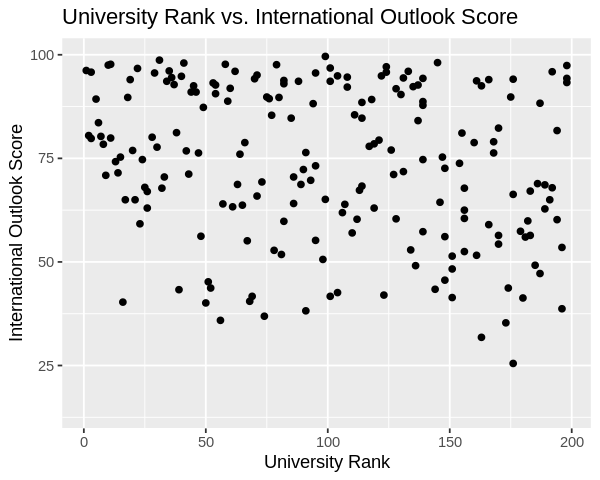

In [3]:
options(repr.plot.width= 5, repr.plot.height=4)

plot_1 <- cleaned_data_noOH %>%
    ggplot(aes(x = as.numeric(as.character(University.Rank)), y = International.Outlook.Score)) + 
    geom_point() +
    xlab("University Rank") +
    ylab("International Outlook Score") +
    ggtitle("University Rank vs. International Outlook Score")

plot_1

> There doesn't seem to be any sort of relationship between the variables indicating that the rank of the University might not a significant factor in predicting the overall international outlook score.

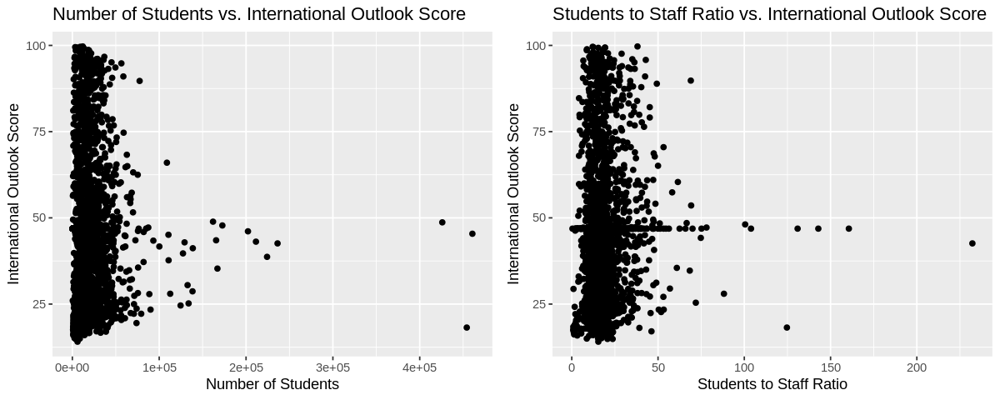

In [4]:
options(repr.plot.width= 10, repr.plot.height=4)

plot_2 <- cleaned_data_noOH %>%
    ggplot(aes(x = No.of.student, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Number of Students") +
    ylab("International Outlook Score") +
    ggtitle("Number of Students vs. International Outlook Score")

plot_3 <- cleaned_data_noOH %>%
    ggplot(aes(x = No.of.student.per.staff, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Students to Staff Ratio") +
    ylab("International Outlook Score") +
    ggtitle("Students to Staff Ratio vs. International Outlook Score")

plot_grid(plot_2, plot_3)

> Hard to tell for this one. The points are highly clustered around the lower end of the range but there could still be a relationship for the majority of points. Still there doesn't really seem to be a relationship at first glance, indicating that the number of students and the student to staff ratio might not be too important to keep.

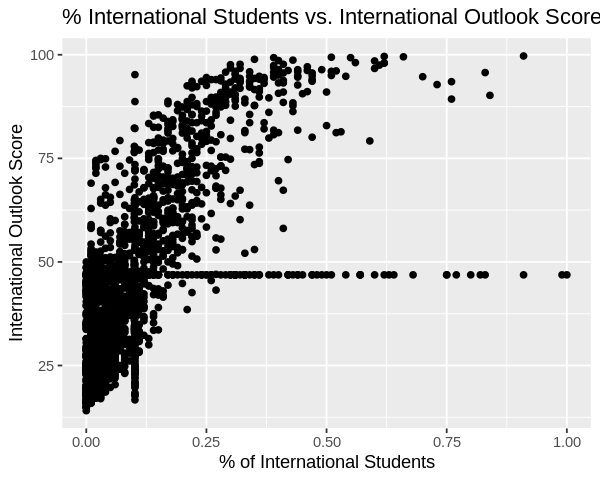

In [5]:
options(repr.plot.width= 5, repr.plot.height=4)

plot_4 <- cleaned_data_noOH %>%
    ggplot(aes(x = International.Student, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("% of International Students") +
    ylab("International Outlook Score") +
    ggtitle("% International Students vs. International Outlook Score")

plot_4

> Now here's a scatter plot that seems to suggest a relationship between the number of international score and and the % of international students. There are a few odd-values that form a line, though that is due to the imputed values and are probably not actually significant to the relationship. Regardless, it seems that keeping the % of Internation Students feature would be a smart idea.

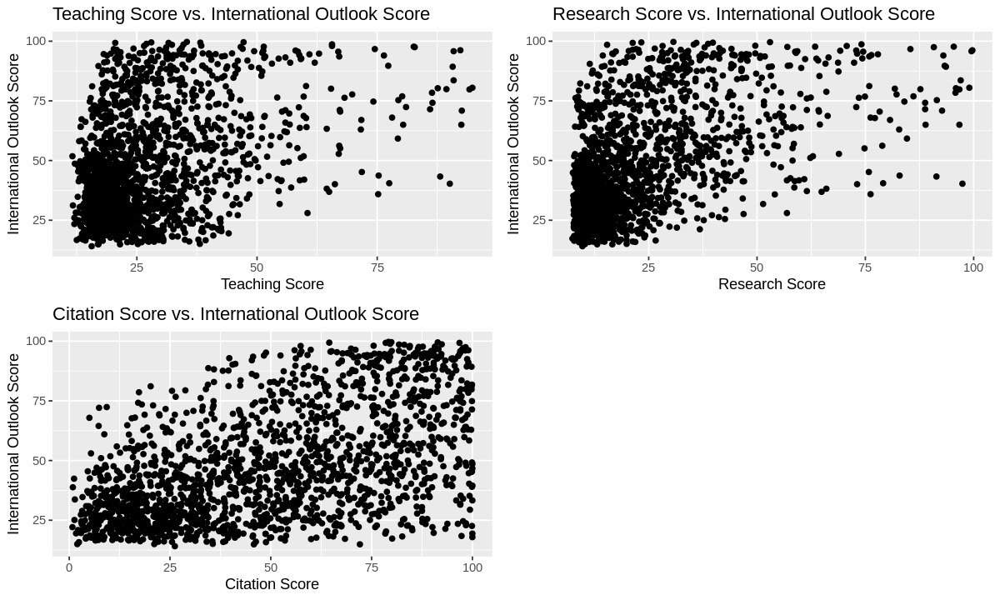

In [6]:
options(repr.plot.width= 10, repr.plot.height= 6)

plot_5 <- cleaned_data_noOH %>%
    ggplot(aes(x = Teaching.Score, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Teaching Score") +
    ylab("International Outlook Score") +
    ggtitle("Teaching Score vs. International Outlook Score")

plot_6 <- cleaned_data_noOH %>%
    ggplot(aes(x = Research.Score, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Research Score") +
    ylab("International Outlook Score") +
    ggtitle("Research Score vs. International Outlook Score")

plot_7 <- cleaned_data_noOH %>%
    ggplot(aes(x = Citations.Score, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Citation Score") +
    ylab("International Outlook Score") +
    ggtitle("Citation Score vs. International Outlook Score")

plot_grid(plot_5, plot_6, plot_7)

> All of the above seem to have a vaugue relationship to our target feature, some more than others. Regardless, while the relationships are not super strong, the various scoring features do seem relevent to creating a predictive model.

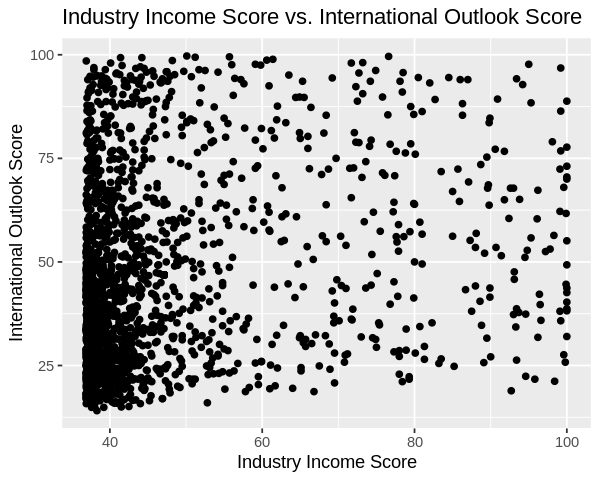

In [7]:
options(repr.plot.width= 5, repr.plot.height=4)

plot_8 <- cleaned_data_noOH %>%
    ggplot(aes(x = Industry.Income.Score, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Industry Income Score") +
    ylab("International Outlook Score") +
    ggtitle("Industry Income Score vs. International Outlook Score")

plot_8

> Ya there's just a bunch of points spread everywhere. The Industry Income Score doesn't seem to have any relationship to the International Outlook Score, so probably no use in keeping in our model.

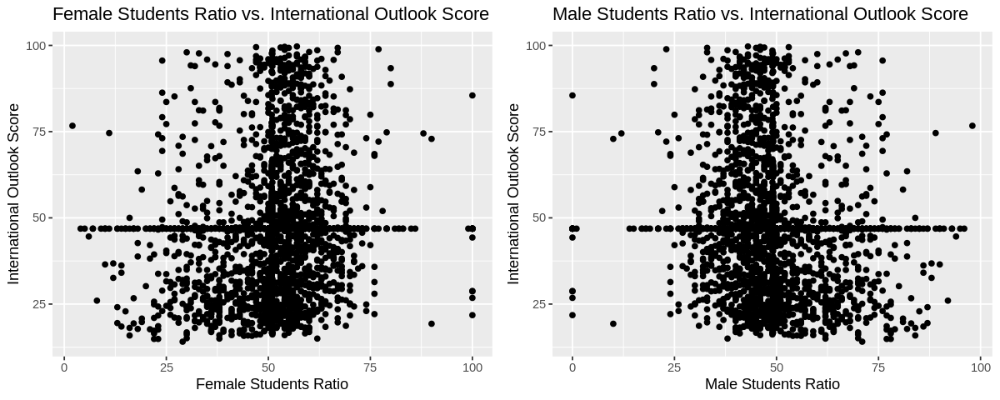

In [8]:
options(repr.plot.width= 10, repr.plot.height=4)

plot_9 <- cleaned_data_noOH %>%
    ggplot(aes(x = Female.Ratio, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Female Students Ratio") +
    ylab("International Outlook Score") +
    ggtitle("Female Students Ratio vs. International Outlook Score")

plot_10 <- cleaned_data_noOH %>%
    ggplot(aes(x = Male.Ratio, y = International.Outlook.Score)) + 
    geom_point() +
    xlab("Male Students Ratio") +
    ylab("International Outlook Score") +
    ggtitle("Male Students Ratio vs. International Outlook Score")

plot_grid(plot_9,plot_10)

> With these featues being mirrors of each other, pulling them apart doesn't really seem super useful. In terms of their relationship to the international outlook score though it seem as though neither of them have a defined relationship to our target as so they might not be super relevent to our prospective predictive model.

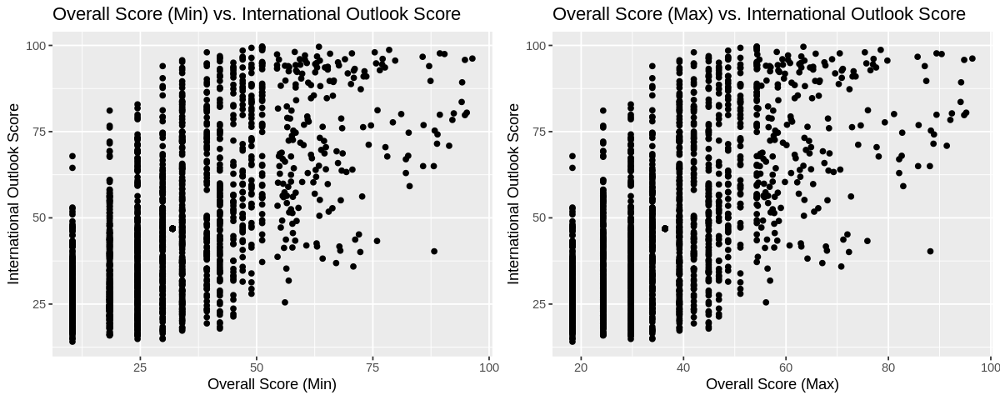

In [9]:
options(repr.plot.width= 10, repr.plot.height=4)

plot_11 <- cleaned_data_noOH %>%
    ggplot(aes(x = OverAll.Score.Min, y = International.Outlook.Score)) + 
    geom_point()+
    xlab("Overall Score (Min)") +
    ylab("International Outlook Score") +
    ggtitle("Overall Score (Min) vs. International Outlook Score")

plot_12 <- cleaned_data_noOH %>%
    ggplot(aes(x = OverAll.Score.Max, y = International.Outlook.Score)) + 
    geom_point()+
    xlab("Overall Score (Max)") +
    ylab("International Outlook Score") +
    ggtitle("Overall Score (Max) vs. International Outlook Score")

plot_grid(plot_11, plot_12)

> There does seem to be a relatively linear relationship in the case of overall score to the international outlook score. I would imagine that is due to the fomer being in part calculated with the ladder, but regardless the relationship does seem to be there. There is a slight issue to how many imputed values are introduced into the data making this relationship seem a bit rocky, but it doesn't seem like too much of streach to assume that the overall score would be useful in some predictive model.